In [1]:
import ast
import glob
import os
import os.path as osp

import cv2
from matplotlib import pyplot as plt
import pandas as pd

In [2]:
def plot_show(img):
    plt.figure(figsize=(10, 10))
    plt.imshow(img, cmap='gray')
    plt.show()
    
def plot_masks(arrays, names, preds):
    nrows = 1
    ncols = len(arrays)
    fig, ax = plt.subplots(ncols=ncols, nrows=nrows, figsize=(ncols*5, nrows*4))
    for i, (mask, name, pred) in enumerate(zip(arrays, names, preds)):
        fig.add_subplot(nrows, ncols, i+1)
        plt.imshow(arrays[0], cmap="gray")
        if name != "image":
            plt.imshow(mask, alpha=0.25)
            ax[i].set_title(f"{name}/pred_{pred}", fontsize=23)  # set title
        else:
            ax[i].set_title(name, fontsize=23)
    plt.show()

In [6]:
data_dir =  osp.join("..", "data", "Dataset")
df = pd.read_csv(osp.join(data_dir, "OpenPart.csv"))

In [8]:
orig_data = glob.glob(osp.join(data_dir, "Origin", "*"))
expert_masks = glob.glob(osp.join(data_dir, "Expert", "*"))
masks_nn_1 = glob.glob(osp.join(data_dir, "sample_1", "*"))
masks_nn_2 = glob.glob(osp.join(data_dir, "sample_2", "*"))
masks_nn_3 = glob.glob(osp.join(data_dir, "sample_3", "*"))
assert len(orig_data) == len(expert_masks) == len(masks_nn_1) == len(masks_nn_2) == len(masks_nn_3)

../data/Dataset/Origin/00006948_002.png


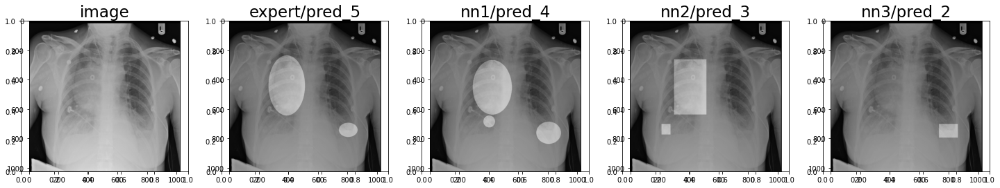

../data/Dataset/Origin/00013977_005.png


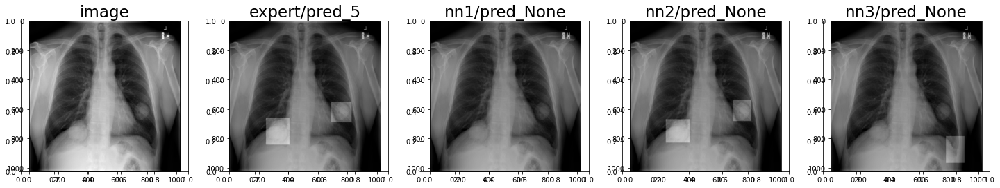

../data/Dataset/Origin/00000344_003.png


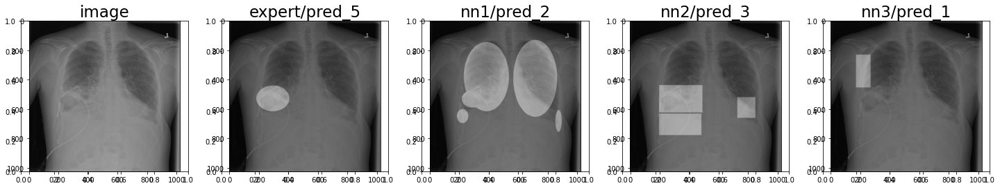

../data/Dataset/Origin/00002711_000.png


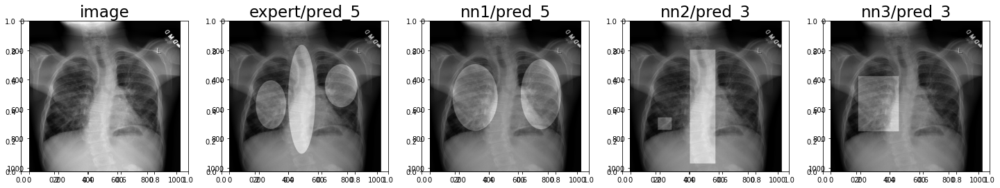

../data/Dataset/Origin/00009368_006.png


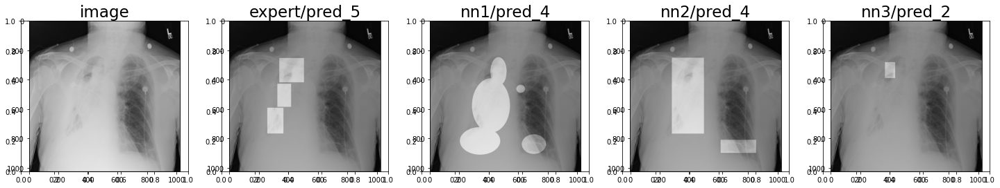

../data/Dataset/Origin/00010815_006.png


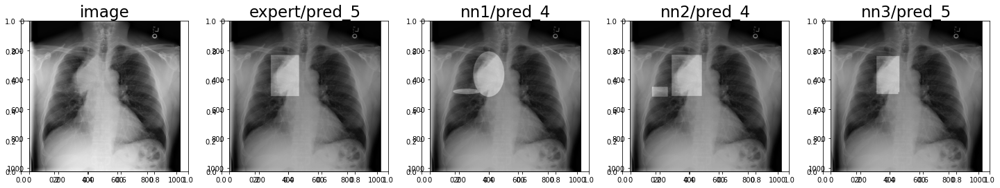

../data/Dataset/Origin/00009619_000.png


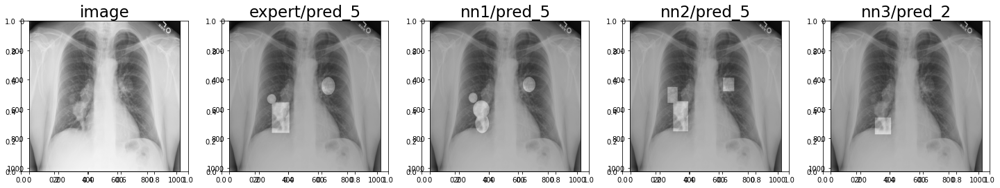

../data/Dataset/Origin/00010103_014.png


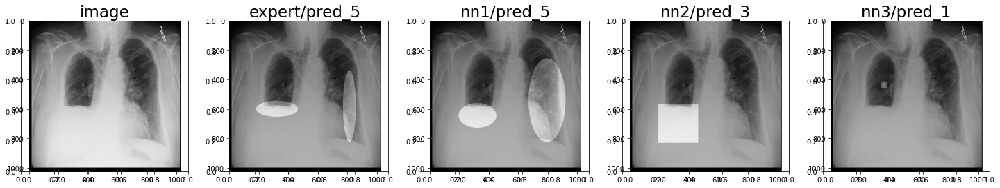

../data/Dataset/Origin/00018366_000.png


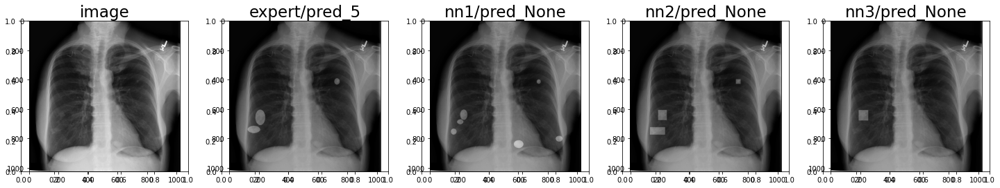

../data/Dataset/Origin/00018063_000.png


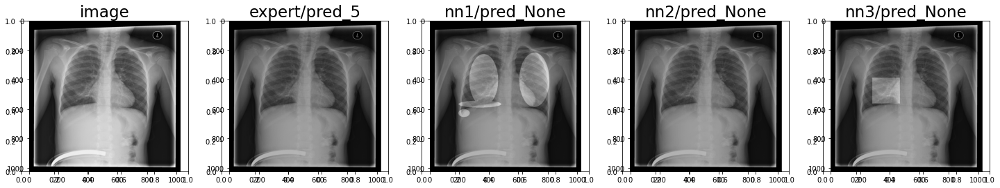

../data/Dataset/Origin/00010060_038.png


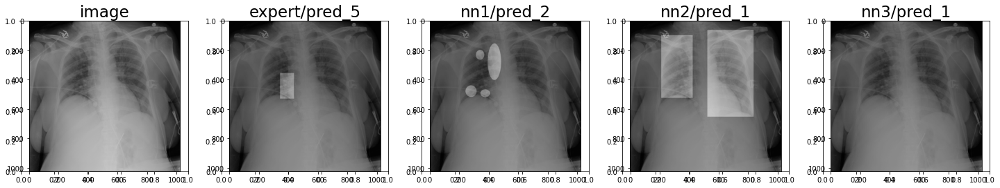

../data/Dataset/Origin/00002856_009.png


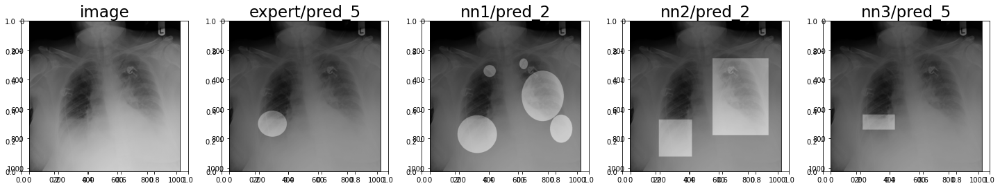

../data/Dataset/Origin/00014015_003.png


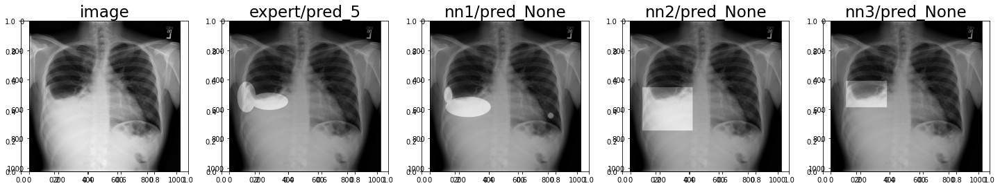

../data/Dataset/Origin/00011502_001.png


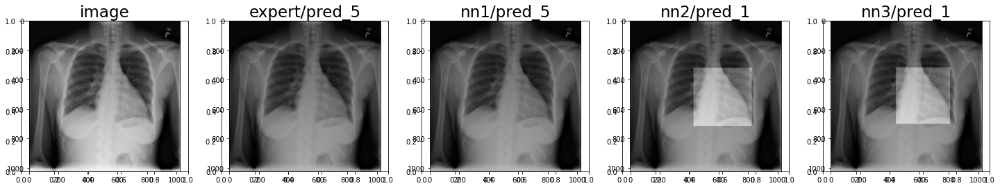

../data/Dataset/Origin/00002583_014.png


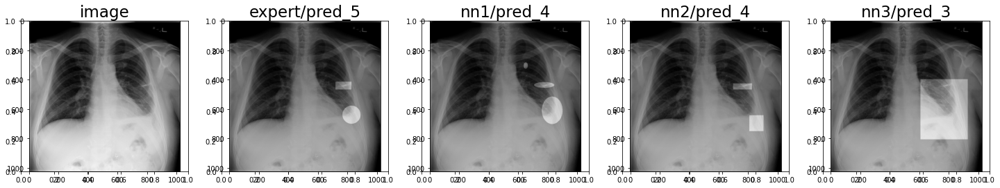

../data/Dataset/Origin/00002578_000.png


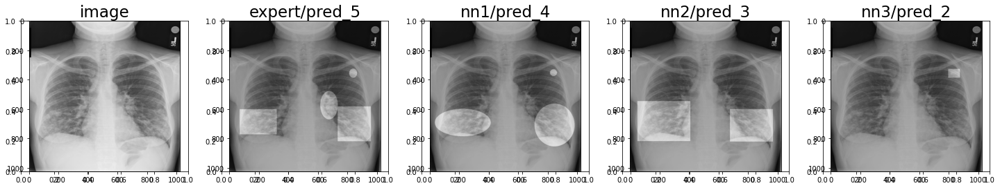

../data/Dataset/Origin/00000830_000.png


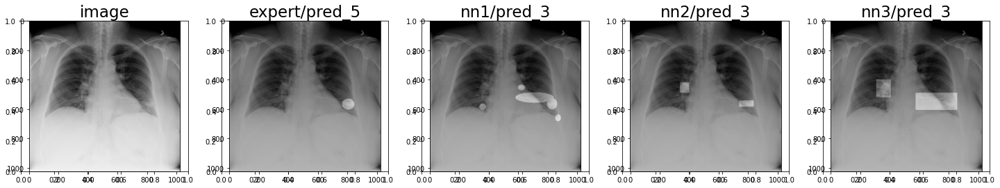

../data/Dataset/Origin/00017028_000.png


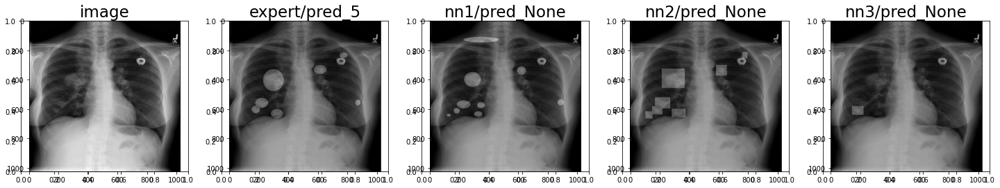

../data/Dataset/Origin/00011237_006.png


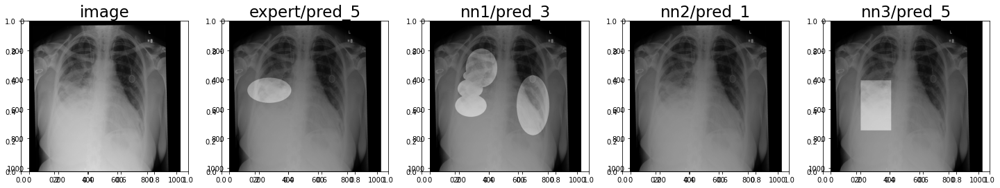

../data/Dataset/Origin/00019495_004.png


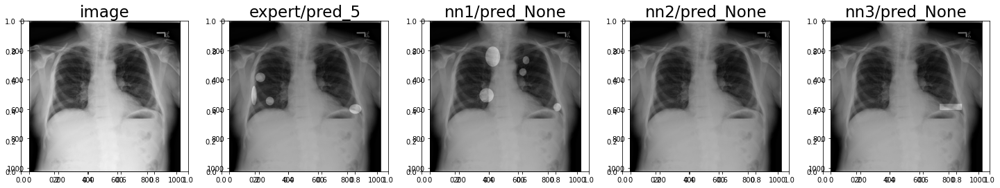

../data/Dataset/Origin/00009507_004.png


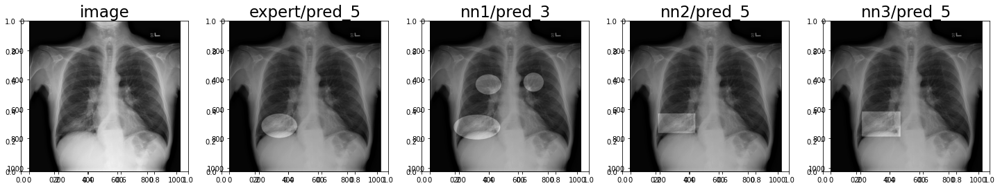

../data/Dataset/Origin/00003391_001.png


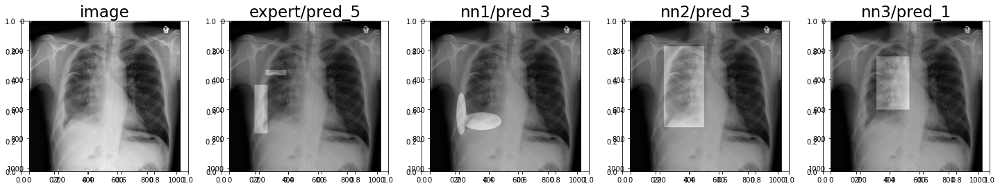

../data/Dataset/Origin/00000211_019.png


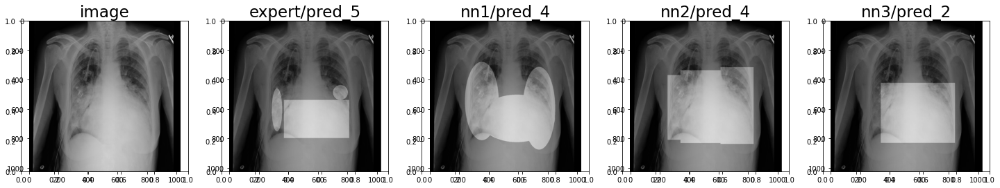

../data/Dataset/Origin/00008814_010.png


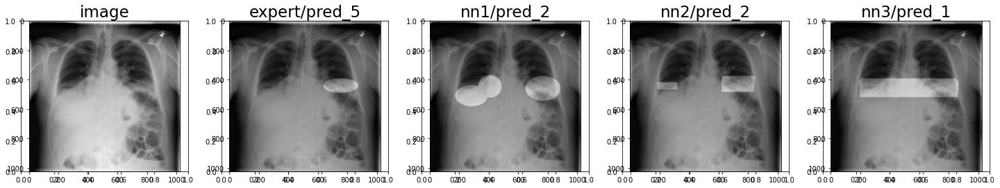

../data/Dataset/Origin/00000150_002.png


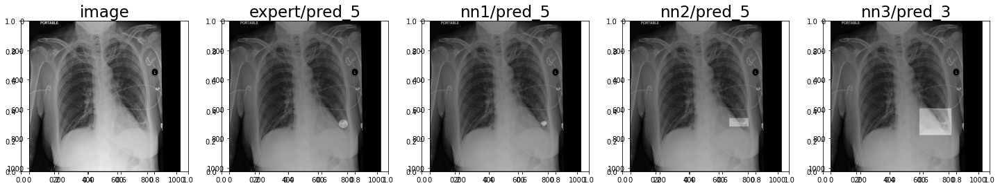

../data/Dataset/Origin/00012829_004.png


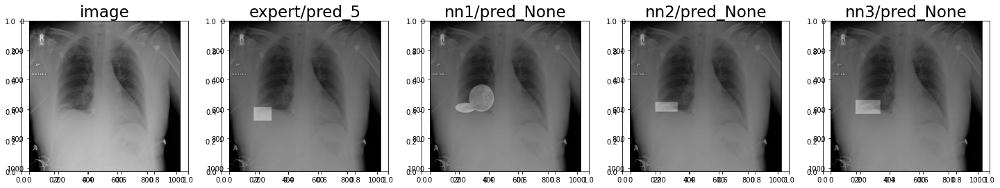

../data/Dataset/Origin/00007034_016.png


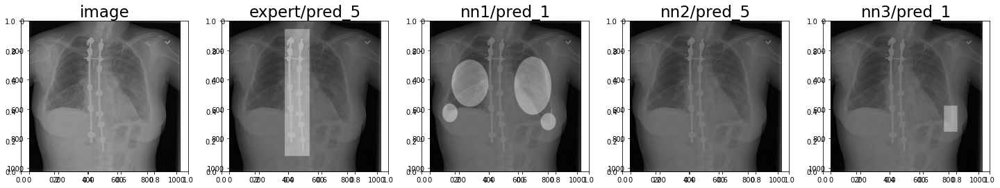

../data/Dataset/Origin/00003400_003.png


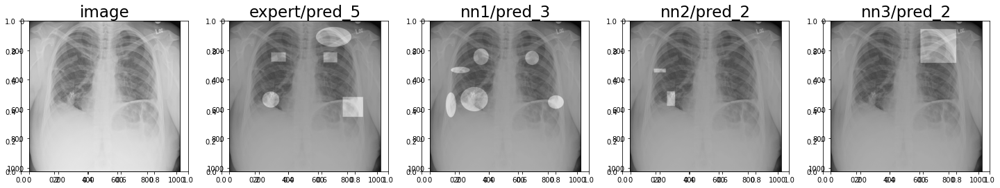

../data/Dataset/Origin/00008547_001.png


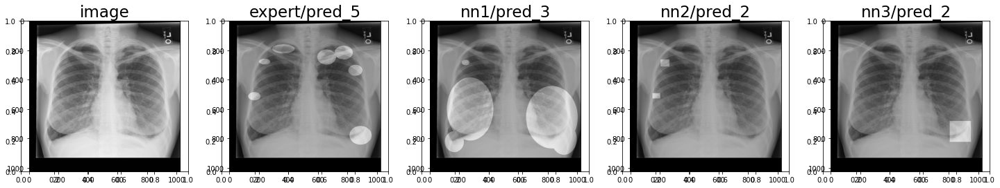

../data/Dataset/Origin/00002980_000.png


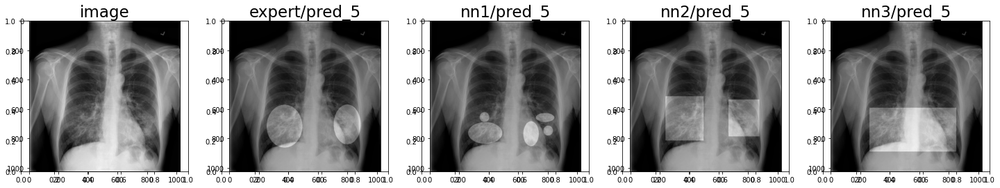

../data/Dataset/Origin/00012892_010.png


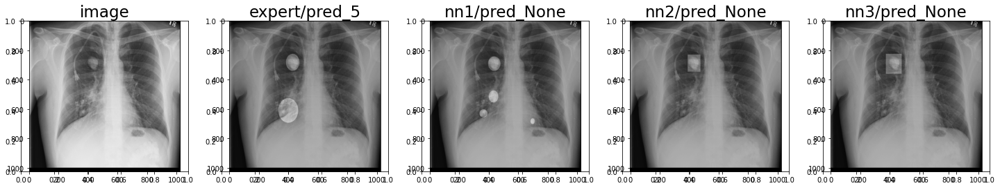

../data/Dataset/Origin/00000974_002.png


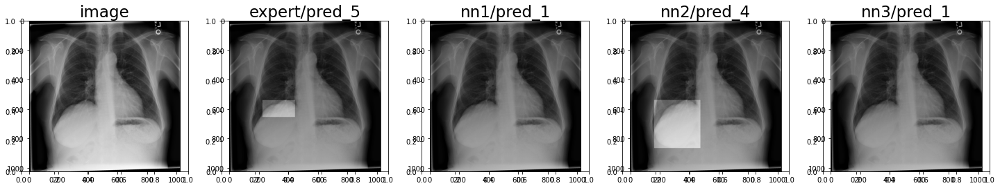

../data/Dataset/Origin/00005353_000.png


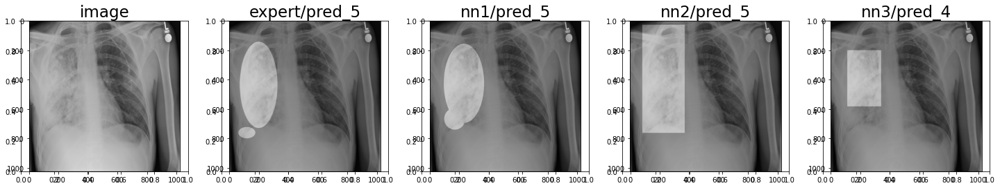

../data/Dataset/Origin/00013673_001.png


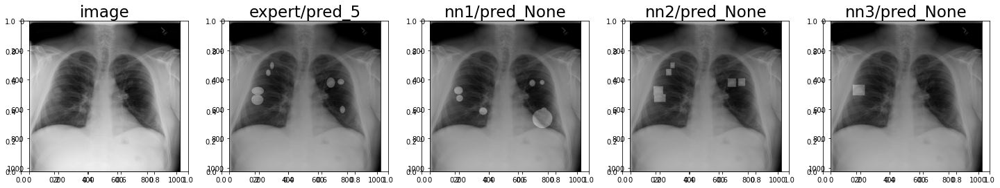

../data/Dataset/Origin/00013951_001.png


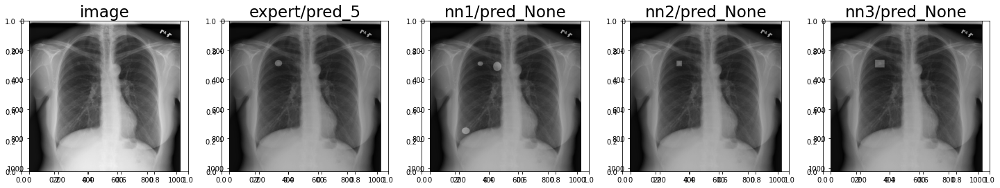

../data/Dataset/Origin/00008386_000.png


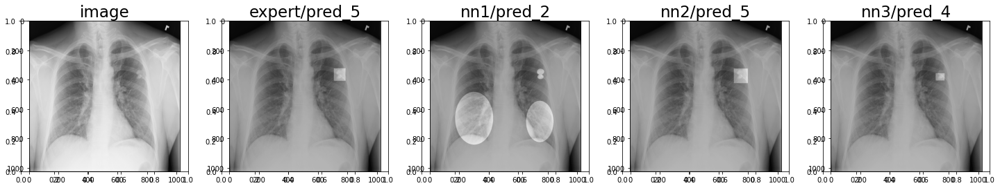

../data/Dataset/Origin/00016267_000.png


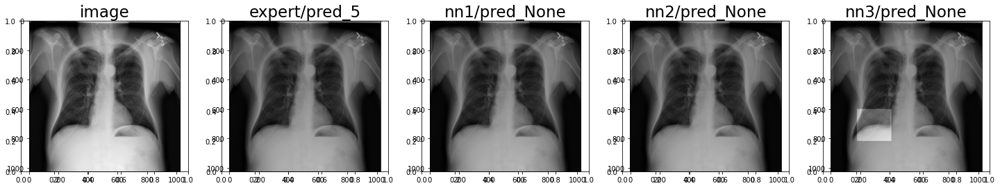

../data/Dataset/Origin/00002763_031.png


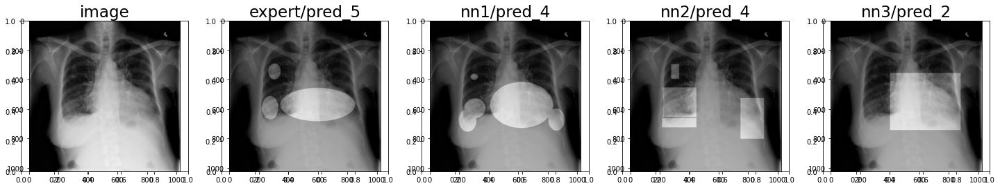

../data/Dataset/Origin/00013685_000.png


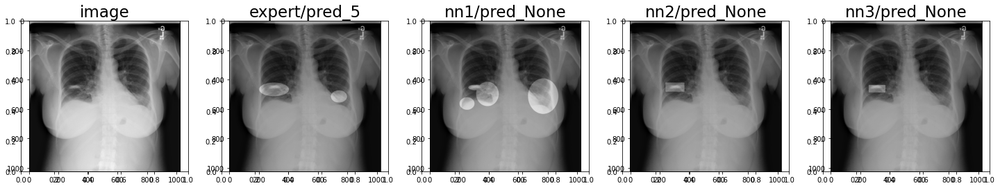

../data/Dataset/Origin/00007882_001.png


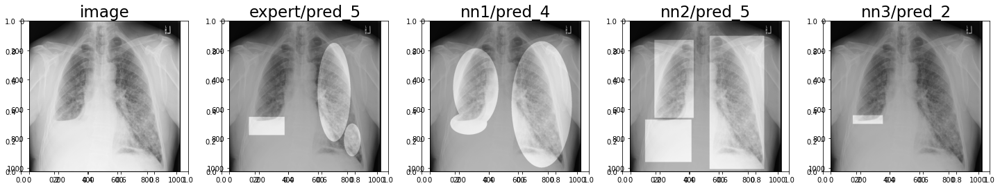

../data/Dataset/Origin/00012094_040.png


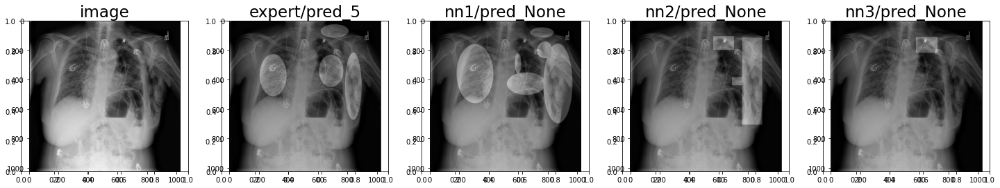

../data/Dataset/Origin/00012414_000.png


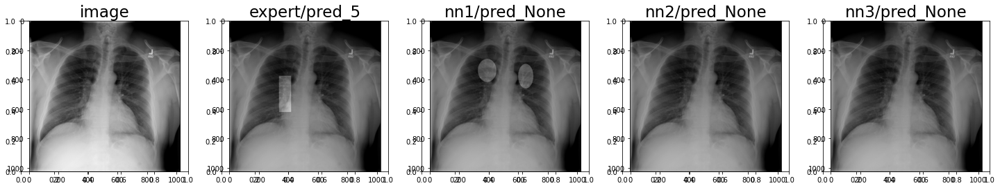

../data/Dataset/Origin/00013991_000.png


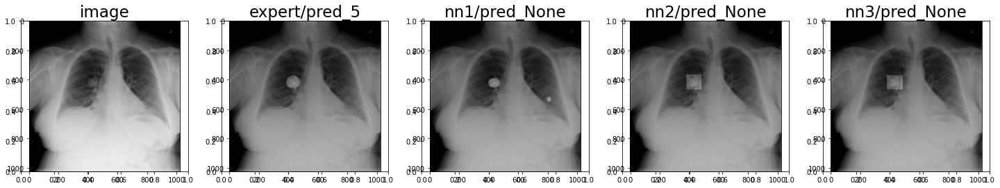

../data/Dataset/Origin/00001075_024.png


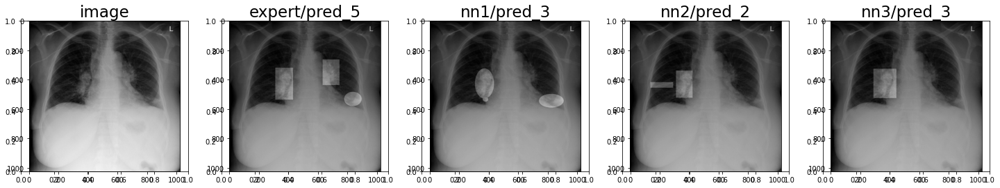

../data/Dataset/Origin/00012174_000.png


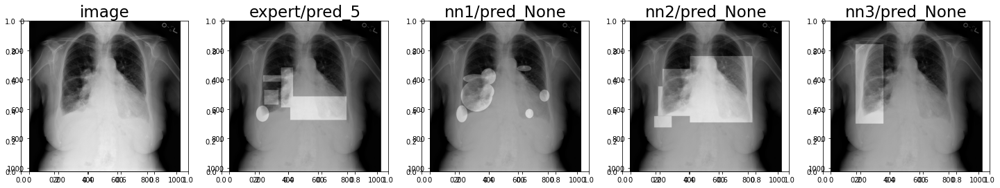

../data/Dataset/Origin/00017243_010.png


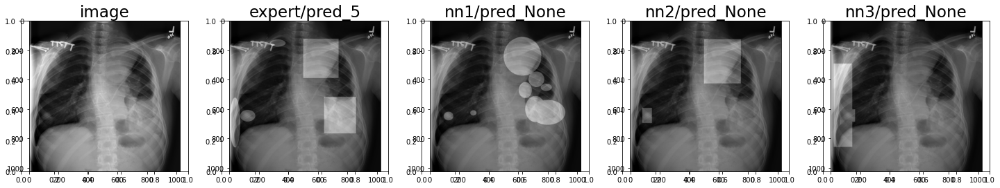

../data/Dataset/Origin/00010277_000.png


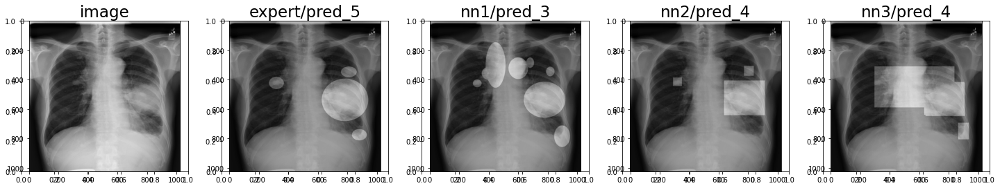

../data/Dataset/Origin/00011269_019.png


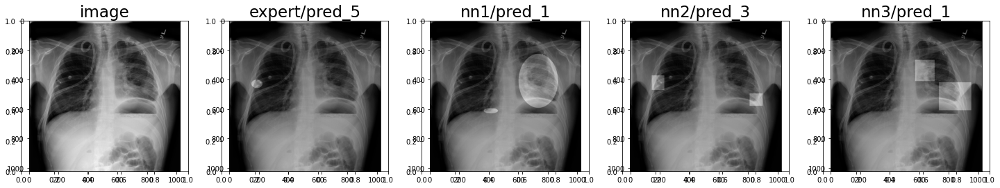

../data/Dataset/Origin/00004808_090.png


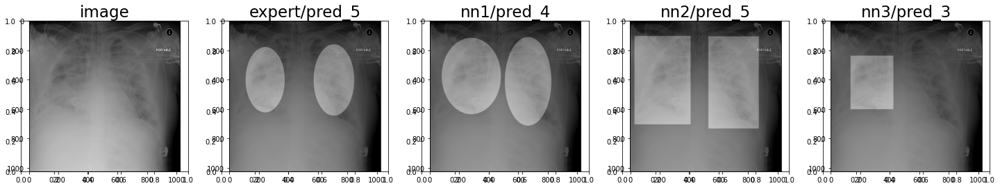

../data/Dataset/Origin/00011355_011.png


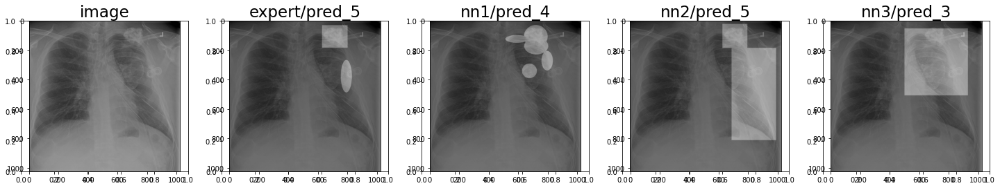

../data/Dataset/Origin/00014447_004.png


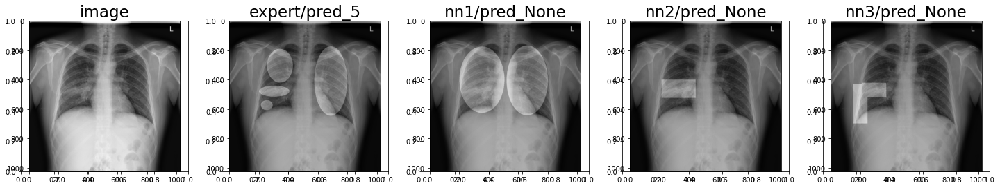

../data/Dataset/Origin/00014280_000.png


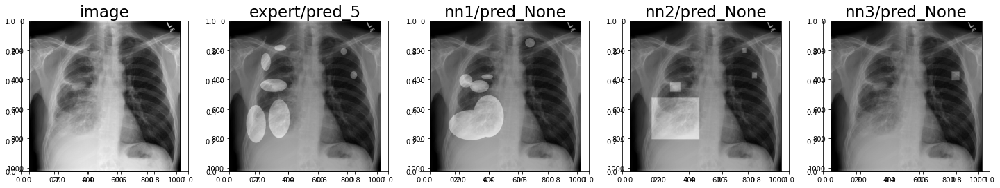

../data/Dataset/Origin/00009437_008.png


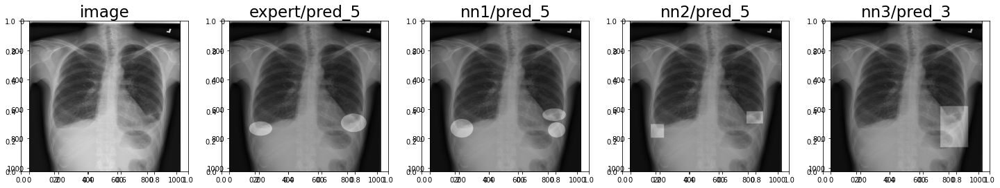

../data/Dataset/Origin/00004911_018.png


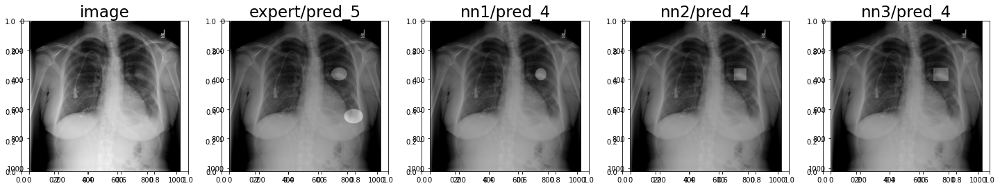

../data/Dataset/Origin/00006323_009.png


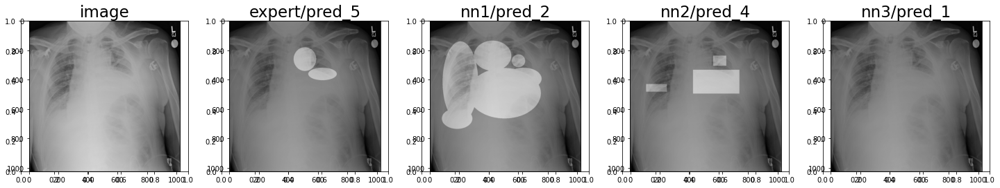

../data/Dataset/Origin/00013751_003.png


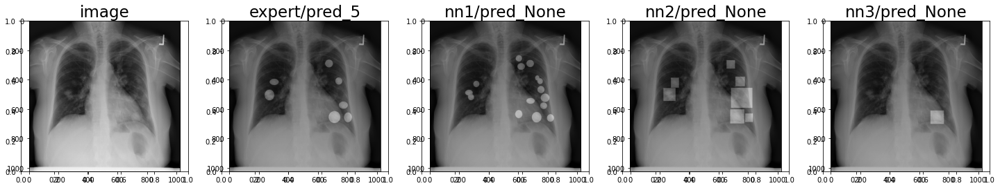

../data/Dataset/Origin/00011827_003.png


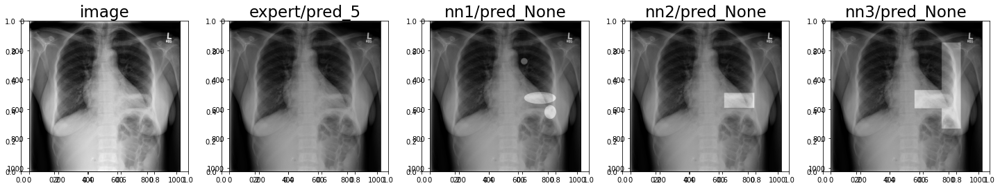

../data/Dataset/Origin/00005215_000.png


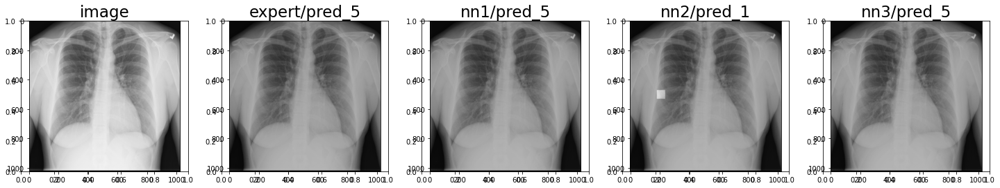

../data/Dataset/Origin/00008554_009.png


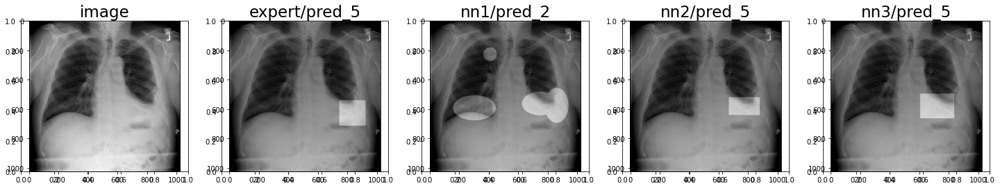

../data/Dataset/Origin/00010381_000.png


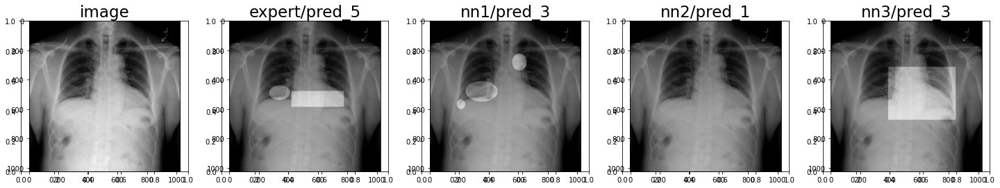

../data/Dataset/Origin/00019767_016.png


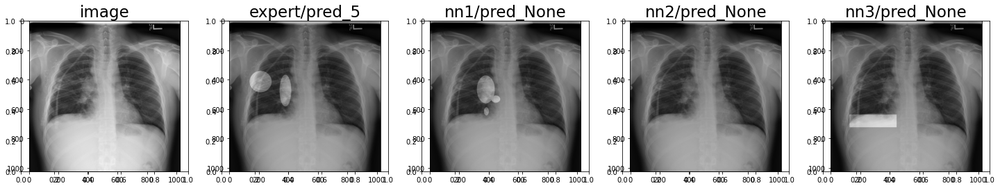

../data/Dataset/Origin/00017137_016.png


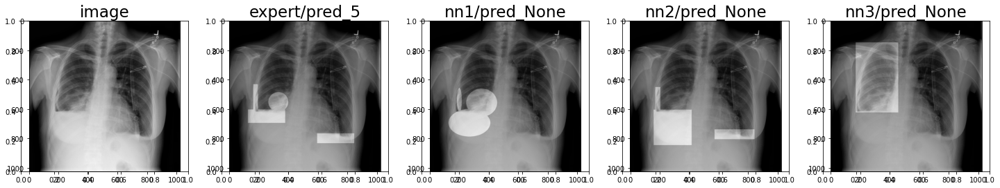

../data/Dataset/Origin/00017214_015.png


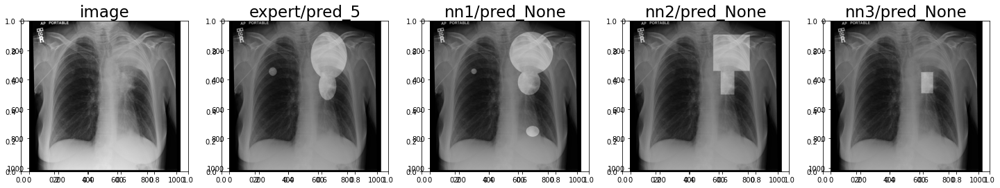

../data/Dataset/Origin/00016589_005.png


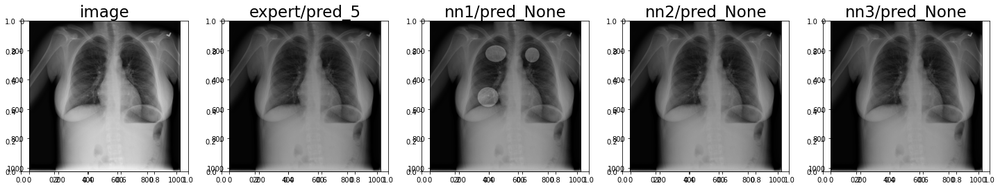

../data/Dataset/Origin/00010447_018.png


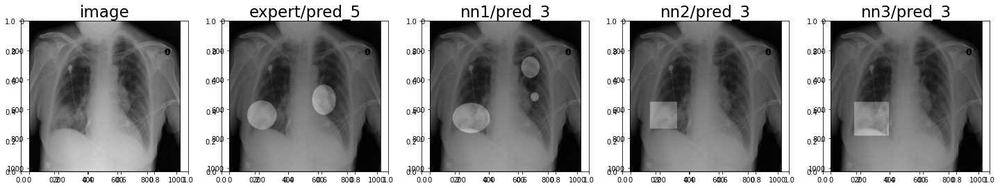

../data/Dataset/Origin/00010936_016.png


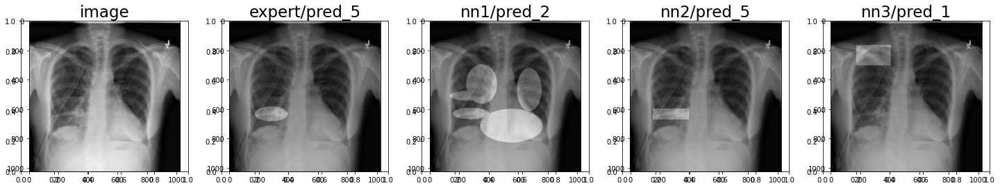

../data/Dataset/Origin/00011450_000.png


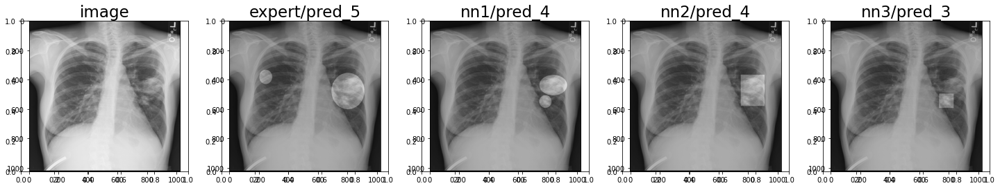

../data/Dataset/Origin/00014251_029.png


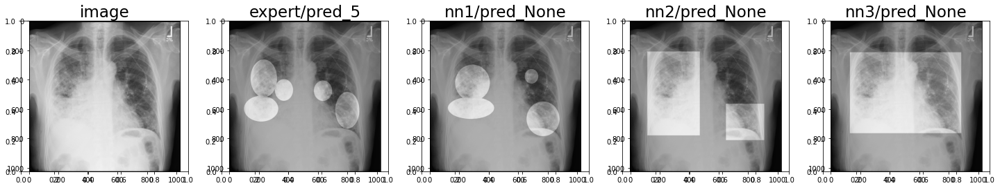

../data/Dataset/Origin/00015792_005.png


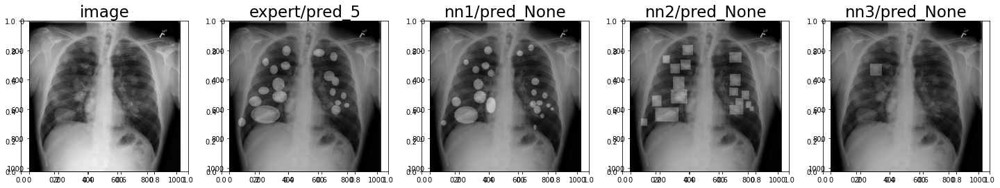

../data/Dataset/Origin/00000468_033.png


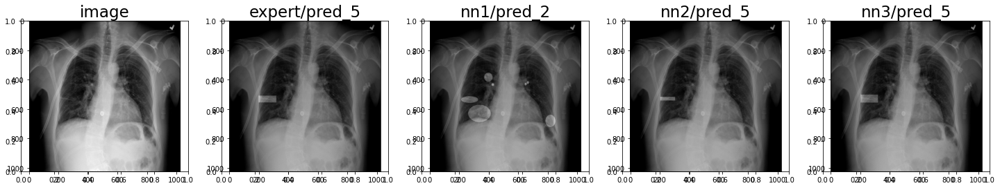

../data/Dataset/Origin/00019124_090.png


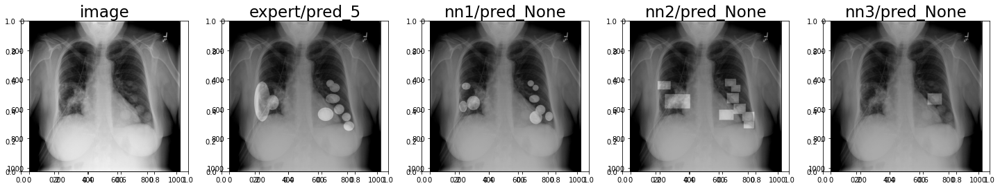

../data/Dataset/Origin/00001187_006.png


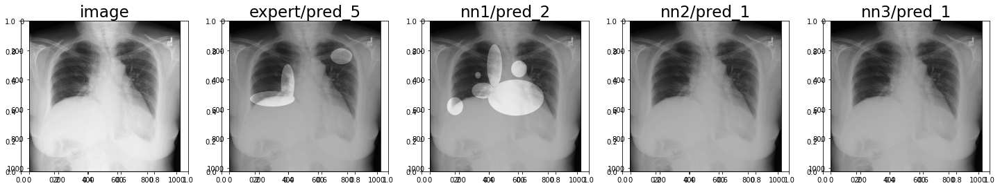

../data/Dataset/Origin/00016429_015.png


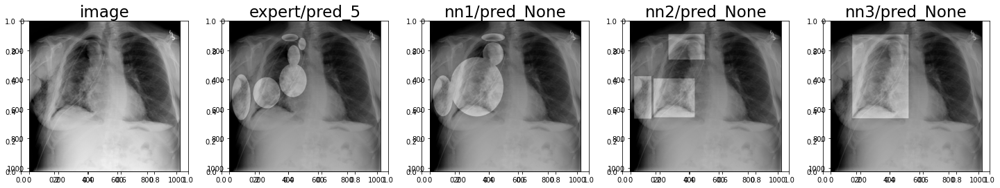

../data/Dataset/Origin/00011157_001.png


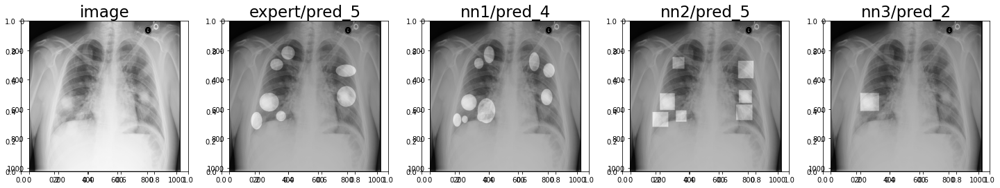

../data/Dataset/Origin/00019013_002.png


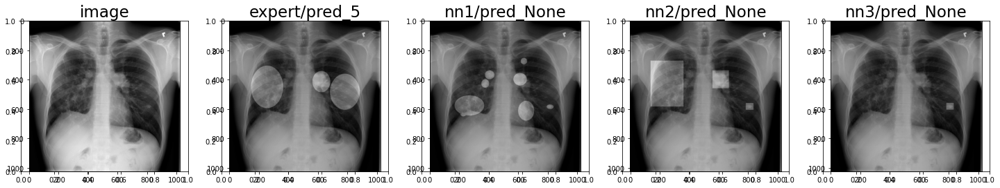

../data/Dataset/Origin/00000211_041.png


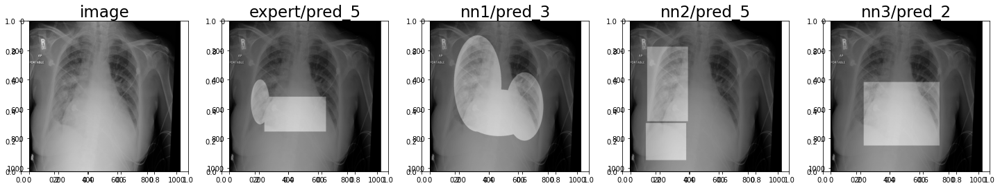

../data/Dataset/Origin/00002350_001.png


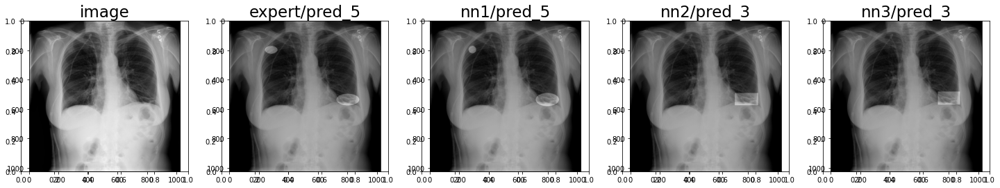

../data/Dataset/Origin/00018980_002.png


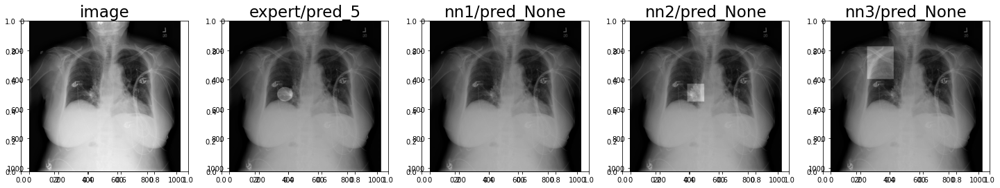

../data/Dataset/Origin/00008008_027.png


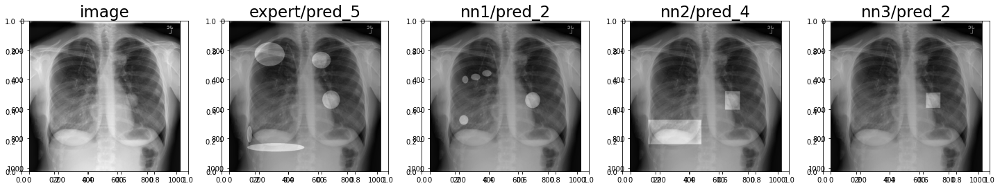

../data/Dataset/Origin/00007558_006.png


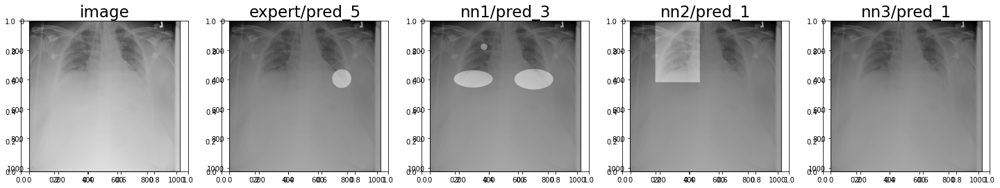

../data/Dataset/Origin/00013911_021.png


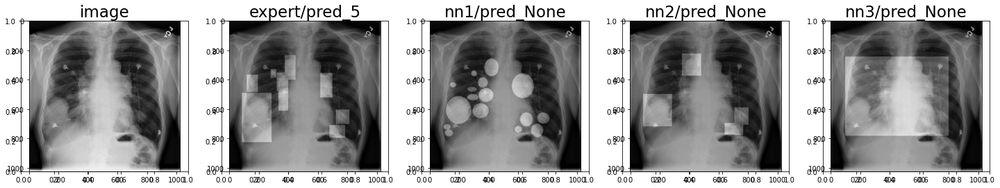

../data/Dataset/Origin/00013337_000.png


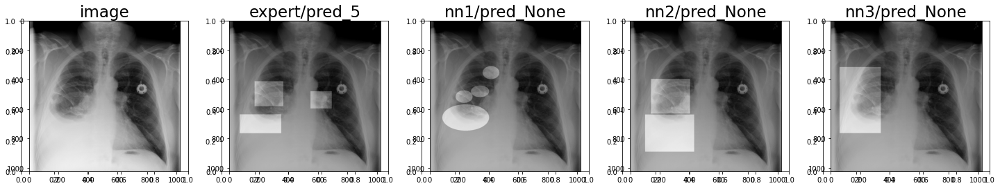

../data/Dataset/Origin/00000808_002.png


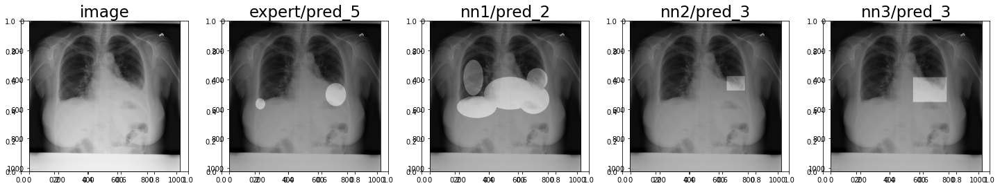

../data/Dataset/Origin/00012592_005.png


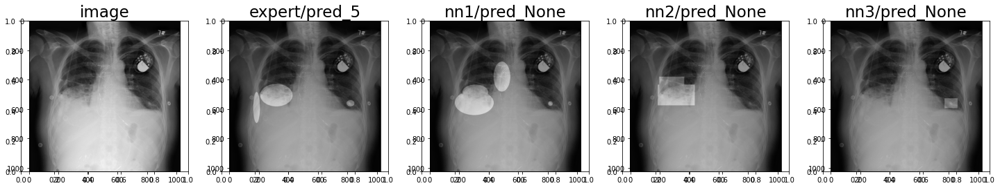

../data/Dataset/Origin/00016587_069.png


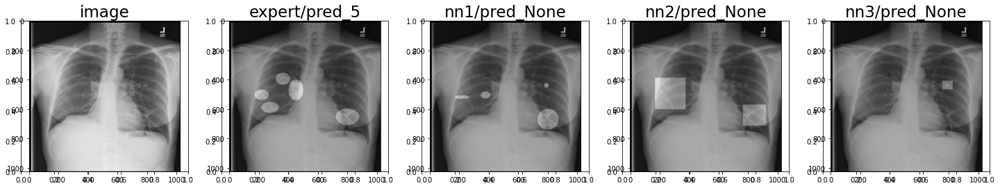

../data/Dataset/Origin/00003894_005.png


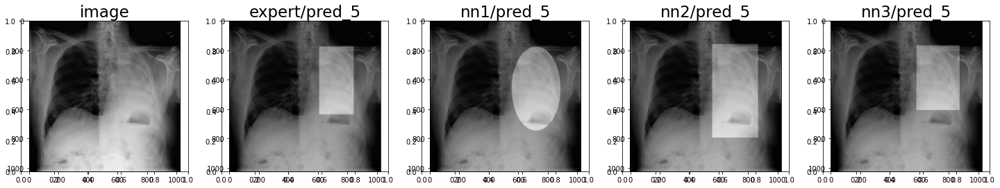

../data/Dataset/Origin/00012045_019.png


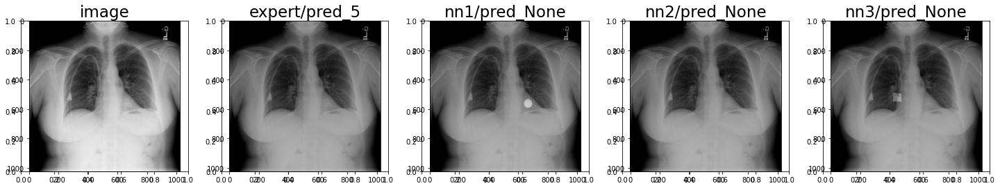

../data/Dataset/Origin/00002597_000.png


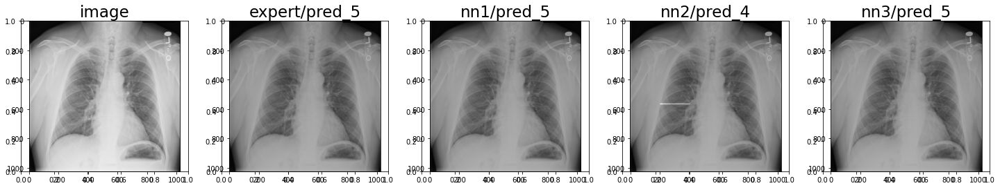

../data/Dataset/Origin/00003973_008.png


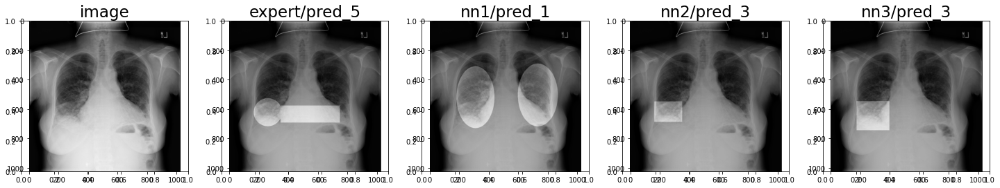

../data/Dataset/Origin/00020124_003.png


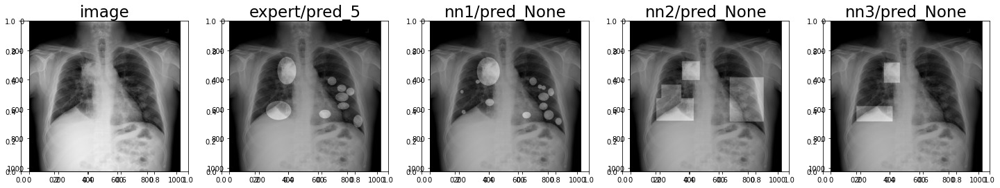

../data/Dataset/Origin/00011925_072.png


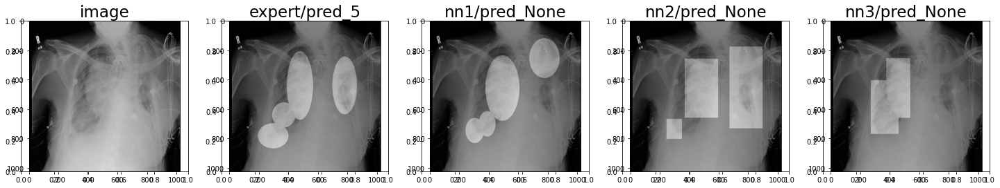

../data/Dataset/Origin/00003333_002.png


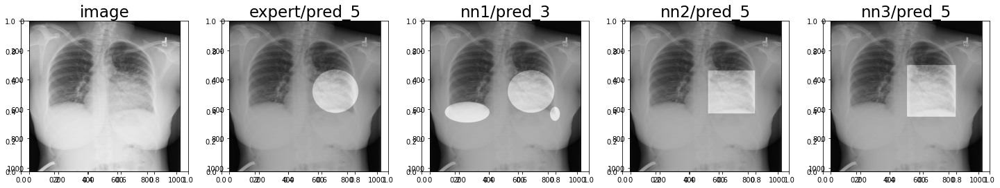

../data/Dataset/Origin/00005089_014.png


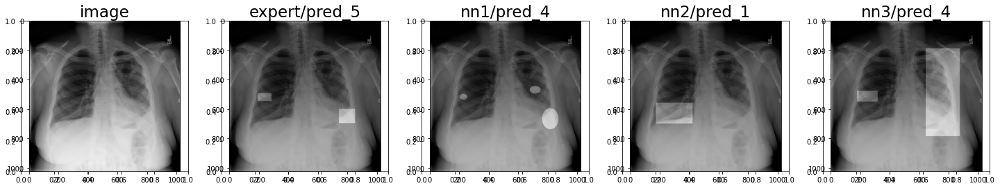

../data/Dataset/Origin/00000072_000.png


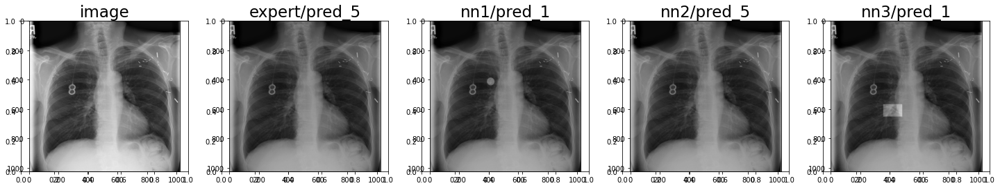

../data/Dataset/Origin/00020000_000.png


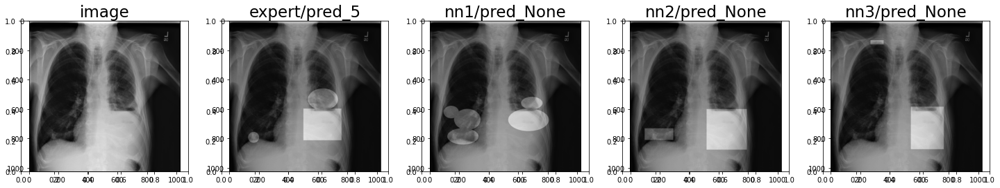

../data/Dataset/Origin/00002706_004.png


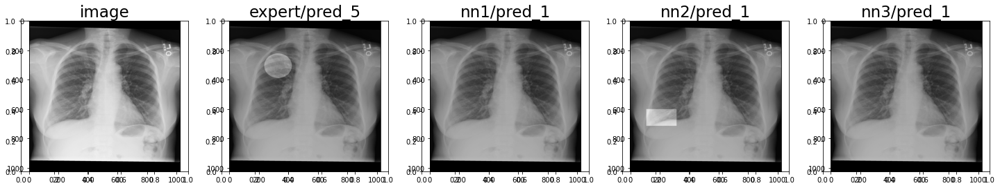

../data/Dataset/Origin/00003787_003.png


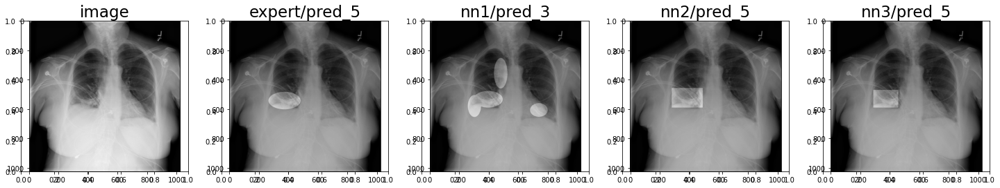

../data/Dataset/Origin/00012270_005.png


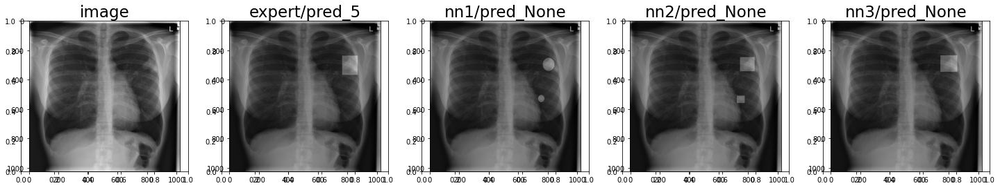

../data/Dataset/Origin/00000181_061.png


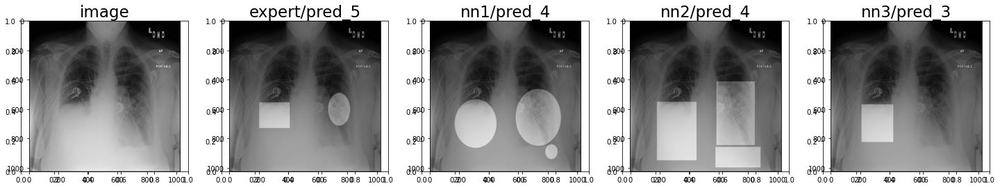

../data/Dataset/Origin/00003072_028.png


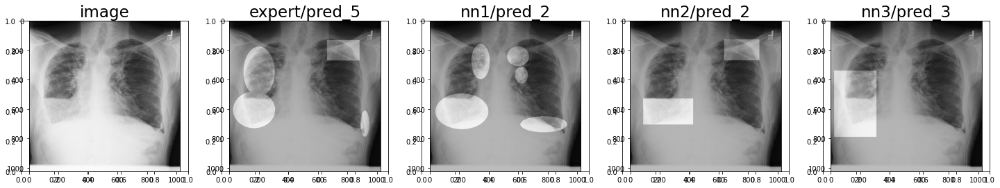

In [10]:
for file in orig_data:
    print(file)
    basename = osp.basename(file)
    filename = osp.splitext(basename)[0] 
    expert_mask_file = osp.join(data_dir, "Expert", f"{filename}_expert.png")
    nn_1_mask_file = osp.join(data_dir, "sample_1", f"{filename}_s1.png")
    nn_2_mask_file = osp.join(data_dir, "sample_2", f"{filename}_s2.png")
    nn_3_mask_file = osp.join(data_dir, "sample_3", f"{filename}_s3.png")
    
    image = cv2.imread(file)
    expert_mask = cv2.imread(expert_mask_file)
    nn_1_mask = cv2.imread(nn_1_mask_file)
    nn_2_mask = cv2.imread(nn_2_mask_file)
    nn_3_mask = cv2.imread(nn_3_mask_file)
    
    assert image.shape == expert_mask.shape == nn_1_mask.shape == nn_2_mask.shape == nn_3_mask.shape
    
    if df.isin([basename]).any().any():
        nn_1_gt = df.loc[(df["Case"] == basename), "Sample 1"].item()
        nn_2_gt = df.loc[(df["Case"] == basename), "Sample 2"].item()
        nn_3_gt = df.loc[(df["Case"] == basename), "Sample 3"].item()
    else:
        nn_1_gt, nn_2_gt, nn_3_gt = None, None, None
    
    arrays = [image, expert_mask, nn_1_mask, nn_2_mask, nn_3_mask]
    names = ["image","expert", "nn1", "nn2", "nn3"]
    preds = ["", 5, nn_1_gt, nn_2_gt, nn_3_gt]

    plot_masks(arrays, names, preds)
    

# EDA

In [11]:
# ! pip install seaborn

In [12]:
import seaborn as sns

In [13]:
non_labeled = []
for file in orig_data:
    basename = osp.basename(file)
    if not df.isin([basename]).any().any():
        non_labeled.append({
            "Case": basename,
            "Sample 1": None,
            "Sample 2": None,
            "Sample 3": None,
        })
df_non_labeled = pd.DataFrame(non_labeled)
df_external = pd.concat([df, df_non_labeled], axis=0, ignore_index=True)

In [14]:
df_external

,Case,Sample 1,Sample 2,Sample 3
0,00000072_000.png,1,5,1
1,00000150_002.png,5,5,3
2,00000181_061.png,4,4,3
3,00000211_019.png,4,4,2
4,00000211_041.png,3,5,2
...,...,...,...,...
95,00012045_019.png,None,None,None
96,00020124_003.png,None,None,None
97,00011925_072.png,None,None,None
98,00020000_000.png,None,None,None


In [15]:
malignant = []
for basename in df_external.Case:
    filename = osp.splitext(basename)[0] 
    expert_mask_file = osp.join(data_dir, "Expert", f"{filename}_expert.png")
    
    expert_mask = cv2.imread(expert_mask_file)
    if expert_mask.sum() > 0:
        malignant.append(True)
    else:
        malignant.append(False)
df_external['malignant'] = malignant

In [16]:
df_external

,Case,Sample 1,Sample 2,Sample 3,malignant
0,00000072_000.png,1,5,1,False
1,00000150_002.png,5,5,3,True
2,00000181_061.png,4,4,3,True
3,00000211_019.png,4,4,2,True
4,00000211_041.png,3,5,2,True
...,...,...,...,...,...
95,00012045_019.png,None,None,None,False
96,00020124_003.png,None,None,None,True
97,00011925_072.png,None,None,None,True
98,00020000_000.png,None,None,None,True


In [17]:
df_external[df_external['malignant'] == False]

,Case,Sample 1,Sample 2,Sample 3,malignant
0,00000072_000.png,1,5,1,False
15,00002597_000.png,5,4,5,False
31,00005215_000.png,5,1,5,False
59,00011502_001.png,5,1,1,False
62,00018063_000.png,None,None,None,False
70,00016267_000.png,None,None,None,False
80,00011827_003.png,None,None,None,False
84,00016589_005.png,None,None,None,False
95,00012045_019.png,None,None,None,False


### Соотношение с патологиями/без патологий 91 к 9

True     91
False     9
Name: malignant, dtype: int64

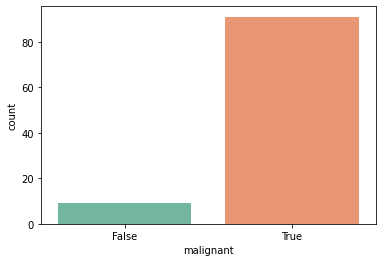

In [18]:
sns.countplot(x = 'malignant', data=df_external, palette="Set2")
df_external['malignant'].value_counts()

### По пездатости моделей nn_2 -> nn1 -> nn3

In [19]:
print("Max possible score: % 2d, nn_1: % 2d, nn_2: % 2d, nn_3: % 2d" %(5*len(df), df_external['Sample 1'].sum(), df_external['Sample 2'].sum(), df_external['Sample 3'].sum()))

Max possible score:  300, nn_1:  194, nn_2:  209, nn_3:  167


### nn1

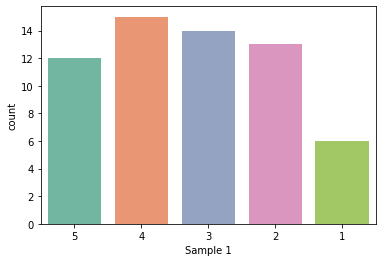

In [20]:
sns.countplot(x='Sample 1', data=df_external, palette="Set2", order=[5, 4, 3, 2, 1])

### nn2

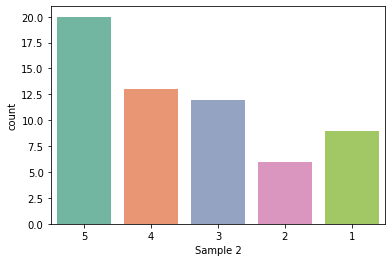

In [21]:
sns.countplot(x='Sample 2', data=df_external, palette="Set2", order=[5, 4, 3, 2, 1])

### nn3

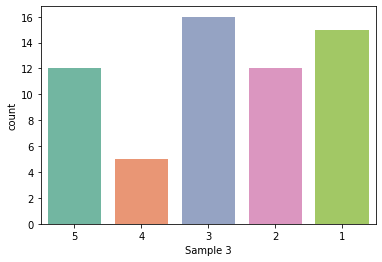

In [22]:
sns.countplot(x='Sample 3', data=df_external, palette="Set2", order=[5, 4, 3, 2, 1])